In [6]:
#Importing Python libraries
#You should download dataset from UCI databease
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
#If you don't have Missingno install it by using pip install missigno
import missingno
%matplotlib inline

In [7]:
#Creating data set names list
#Adding first 10 data set file names
# All data should be in the same folder!
dataframes_name = []
for i in range(1,10):
    dataframes_name.append(f'data-0{i}') 

In [8]:
#Adding another 60 dataset file names
# All data should be in the same folder!
for i in range(10,71):
    dataframes_name.append(f'data-{i}')

In [9]:
#Creating empty array
# looping through data set files name, reading them by using pandas and appending them to dataframes array
# All data should be in the same folder! If the path of the file is not right nothing will work
dataframes = []
for filename in dataframes_name:
    dataframes.append(pd.read_csv(f'{filename}', sep='\t', names=['Date','Time','Code','Value']))

In [10]:
#Printing first 5 rows of first patient
dataframes[0].head()

,Date,Time,Code,Value
0,04-21-1991,9:09,58,100
1,04-21-1991,9:09,33,9
2,04-21-1991,9:09,34,13
3,04-21-1991,17:08,62,119
4,04-21-1991,17:08,33,7


In [11]:
# Creating array we unused codes
#Dropping rows with unused code by looping through dataframe array
deleting_un = [0,4,36,33,34,35,56,59,61,63,65,66,68,67,69,70,71,72]
for i in range(len(dataframes)):
    for m in deleting_un:
        dataframes[i].drop(dataframes[i][dataframes[i]['Code'] == m].index, inplace=True)

In [12]:
#Printing information about each dataframe
for i in range(len(dataframes)):
    print(dataframes[i].info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 369 entries, 0 to 940
Data columns (total 4 columns):
Date     369 non-null object
Time     369 non-null object
Code     369 non-null int64
Value    369 non-null int64
dtypes: int64(2), object(2)
memory usage: 14.4+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 380 entries, 0 to 759
Data columns (total 4 columns):
Date     380 non-null object
Time     380 non-null object
Code     380 non-null int64
Value    380 non-null object
dtypes: int64(1), object(3)
memory usage: 14.8+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 113 entries, 0 to 298
Data columns (total 4 columns):
Date     113 non-null object
Time     113 non-null object
Code     113 non-null int64
Value    113 non-null int64
dtypes: int64(2), object(2)
memory usage: 4.4+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 129 entries, 0 to 294
Data columns (total 4 columns):
Date     129 non-null object
Time     129 non-null object
Code     129 non

In [13]:
#Counting how many entities each code has 
for i in range(len(dataframes)):
    print(dataframes[i]['Code'].value_counts())

58    135
62    102
48     78
60     54
Name: Code, dtype: int64
58    96
62    95
60    95
48    94
Name: Code, dtype: int64
58    40
62    30
60    25
64    16
57     2
Name: Code, dtype: int64
58    35
64    32
62    32
60    26
57     4
Name: Code, dtype: int64
58    37
64    36
62    33
60    25
57     5
Name: Code, dtype: int64
58    21
60    18
62    17
48     9
Name: Code, dtype: int64
58    34
62    29
60    29
48    21
Name: Code, dtype: int64
58    41
62    32
60    29
64    16
57     9
Name: Code, dtype: int64
64    24
58    24
60    20
62    19
57     2
Name: Code, dtype: int64
62    34
58    34
48    24
60    15
Name: Code, dtype: int64
58    28
64    15
62    13
60     7
57     2
Name: Code, dtype: int64
58    40
64    18
62    18
60     9
57     2
Name: Code, dtype: int64
58    32
62    24
64    23
60    17
57     1
Name: Code, dtype: int64
58    34
64    12
62    11
Name: Code, dtype: int64
58    53
64    22
62    15
60     1
Name: Code, dtype: int64
58    53
62    24


In [14]:
#Checking for missing values quantity
for i in range(len(dataframes)):
    print(dataframes[i].isnull().sum())

Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     0
Value    0
dtype: int64
Date     0
Time     0
Code     

In [15]:
#Converting column type to numeric
for i in range(len(dataframes)):
    dataframes[i]['Value'] = pd.to_numeric(dataframes[i]['Value'], errors = 'coerce')

In [16]:
#Printing information about columns
for i in range(len(dataframes)):
    dataframes[i].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 369 entries, 0 to 940
Data columns (total 4 columns):
Date     369 non-null object
Time     369 non-null object
Code     369 non-null int64
Value    369 non-null int64
dtypes: int64(2), object(2)
memory usage: 14.4+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 380 entries, 0 to 759
Data columns (total 4 columns):
Date     380 non-null object
Time     380 non-null object
Code     380 non-null int64
Value    373 non-null float64
dtypes: float64(1), int64(1), object(2)
memory usage: 14.8+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 113 entries, 0 to 298
Data columns (total 4 columns):
Date     113 non-null object
Time     113 non-null object
Code     113 non-null int64
Value    113 non-null int64
dtypes: int64(2), object(2)
memory usage: 4.4+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 129 entries, 0 to 294
Data columns (total 4 columns):
Date     129 non-null object
Time     129 non-null object
Code     129 non-n

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119 entries, 1 to 298
Data columns (total 4 columns):
Date     119 non-null object
Time     119 non-null object
Code     119 non-null int64
Value    119 non-null int64
dtypes: int64(2), object(2)
memory usage: 4.6+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 32 entries, 4 to 100
Data columns (total 4 columns):
Date     32 non-null object
Time     32 non-null object
Code     32 non-null int64
Value    31 non-null float64
dtypes: float64(1), int64(1), object(2)
memory usage: 1.2+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 243 entries, 0 to 491
Data columns (total 4 columns):
Date     243 non-null object
Time     243 non-null object
Code     243 non-null int64
Value    243 non-null int64
dtypes: int64(2), object(2)
memory usage: 9.5+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 254 entries, 0 to 539
Data columns (total 4 columns):
Date     254 non-null object
Time     254 non-null object
Code     254 non-null int

In [17]:
#Dropping duplicated values, checking for data and code columns
for i in range(len(dataframes)):
    dataframes[i].drop_duplicates(['Date','Code'], inplace=True)

/Users/dave/anaconda3/lib/python3.7/site-packages/missingno/missingno.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)


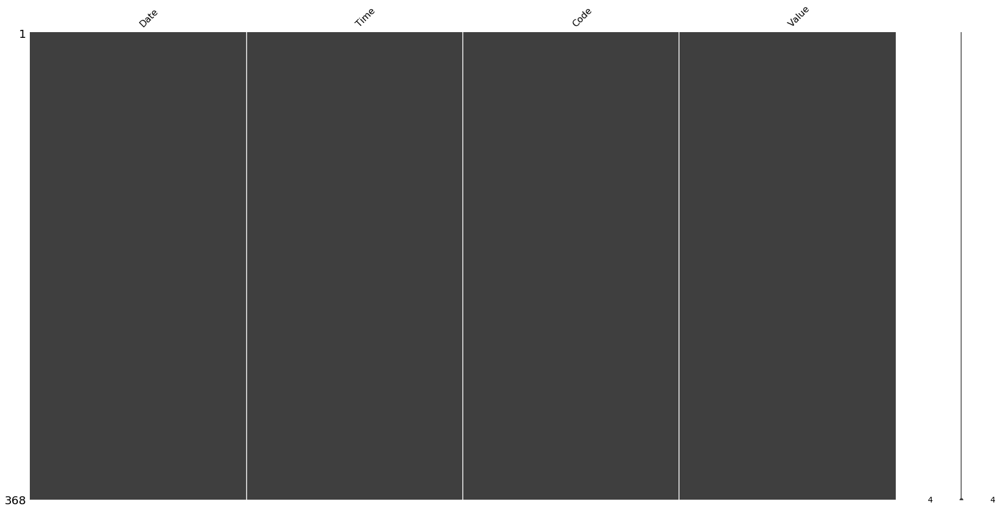

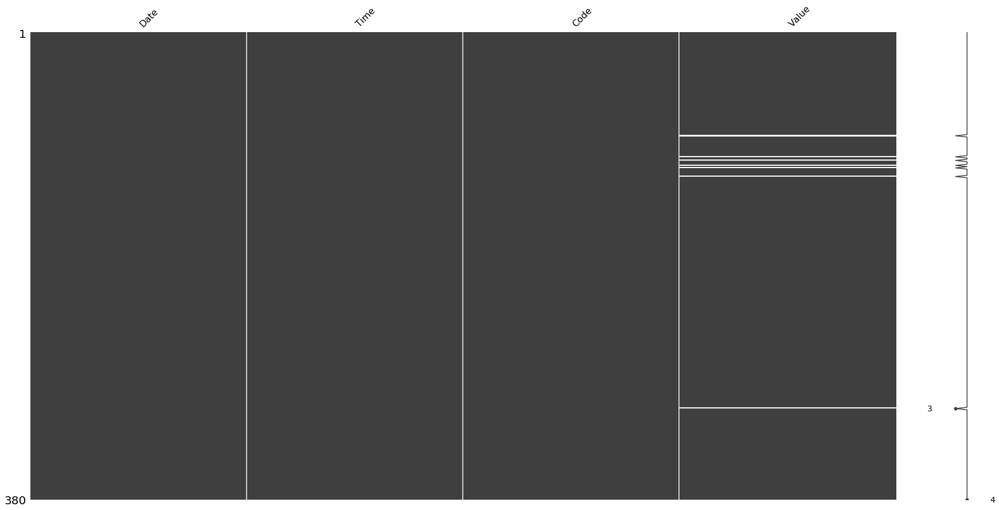

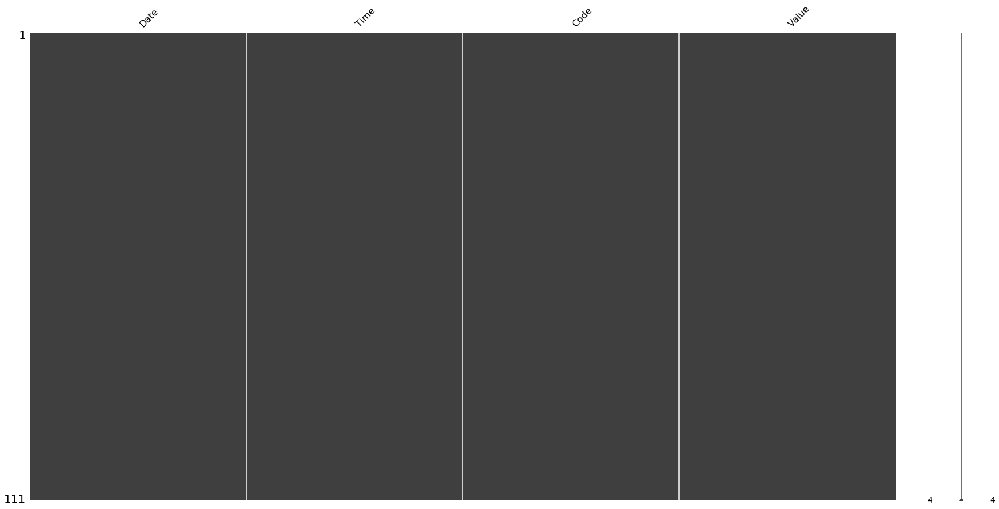

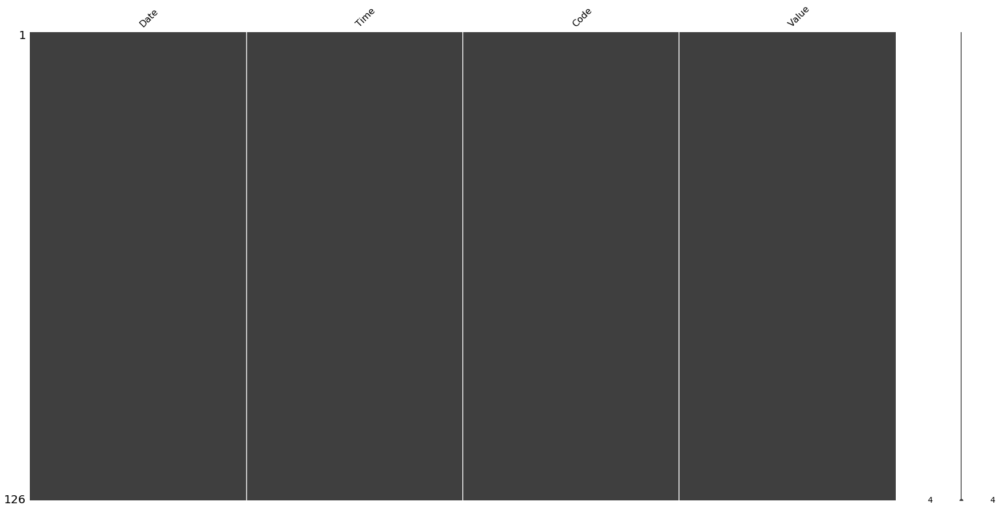

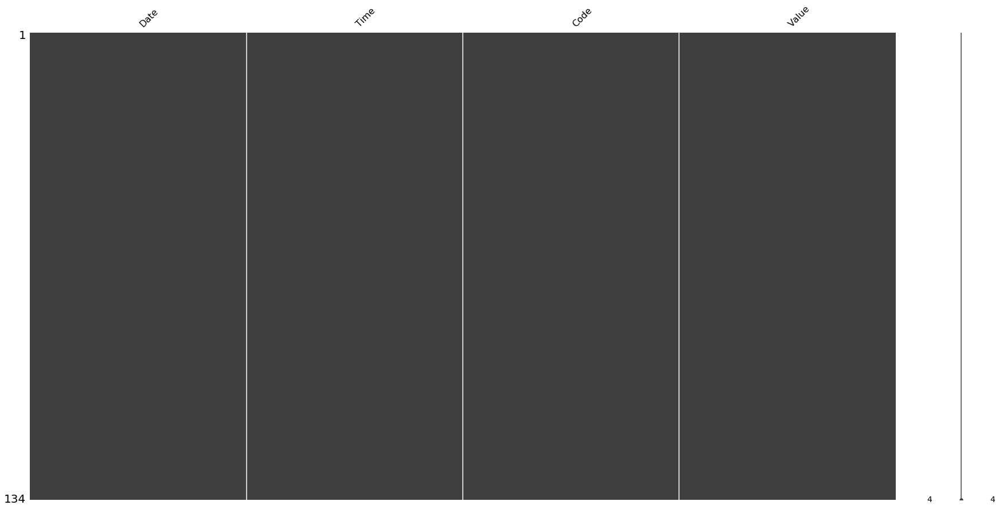

...

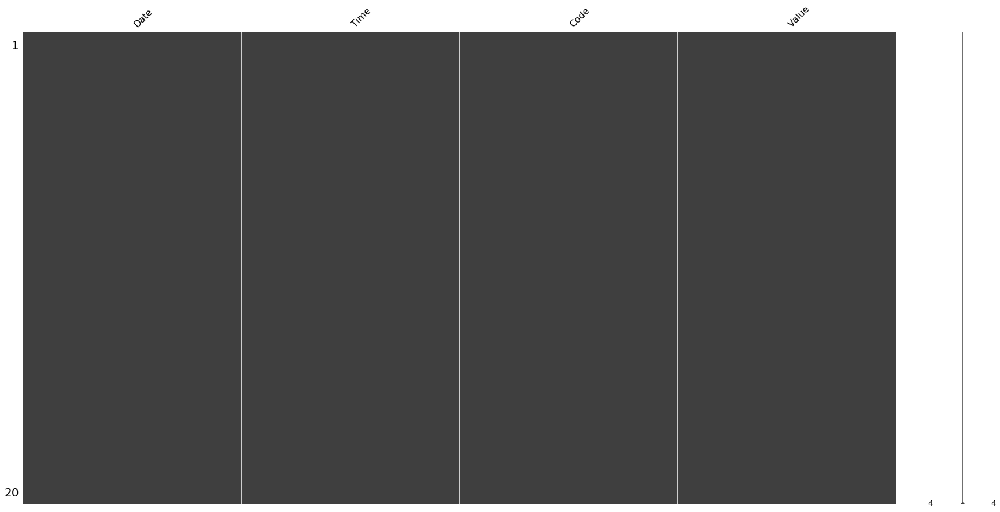

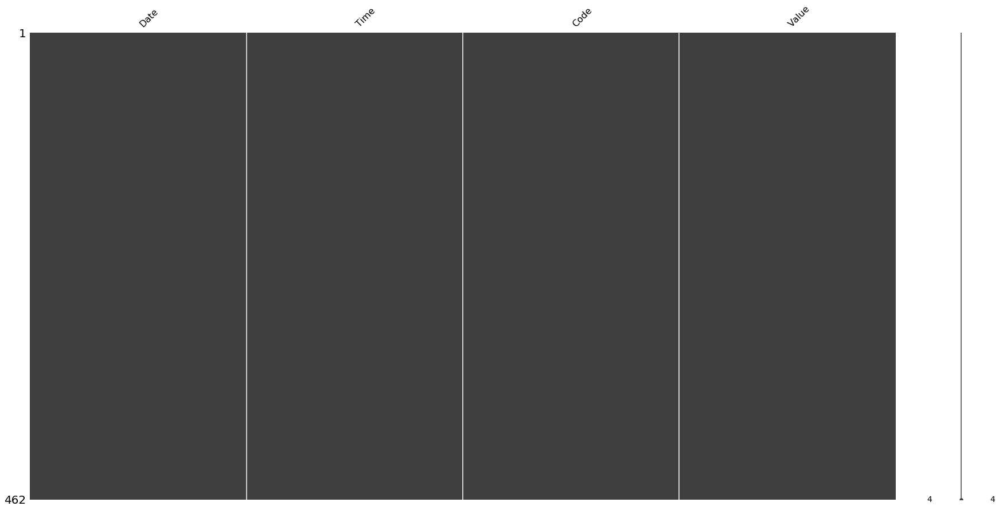

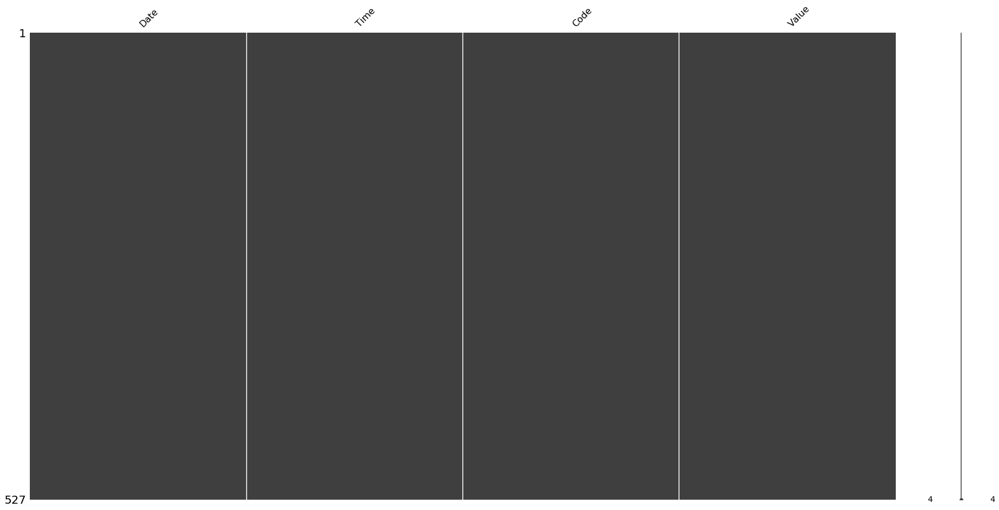

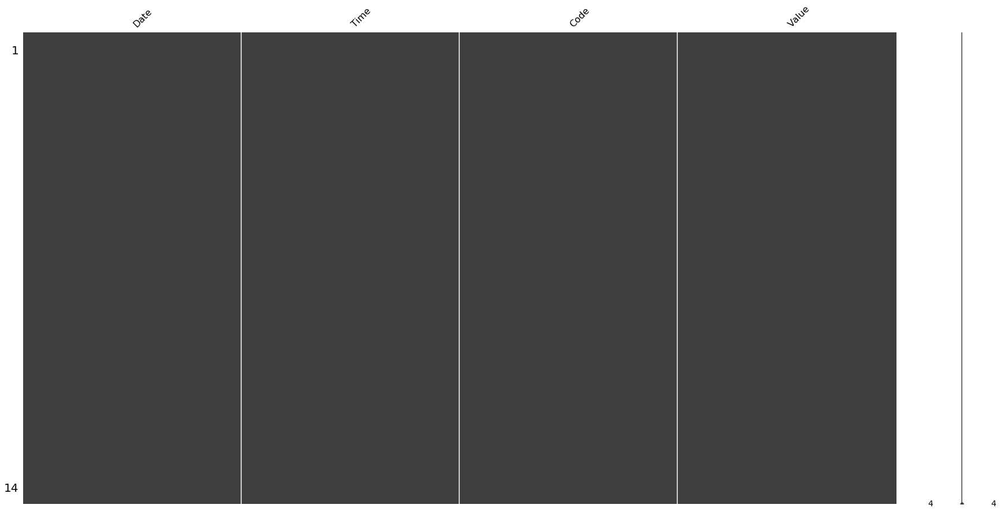

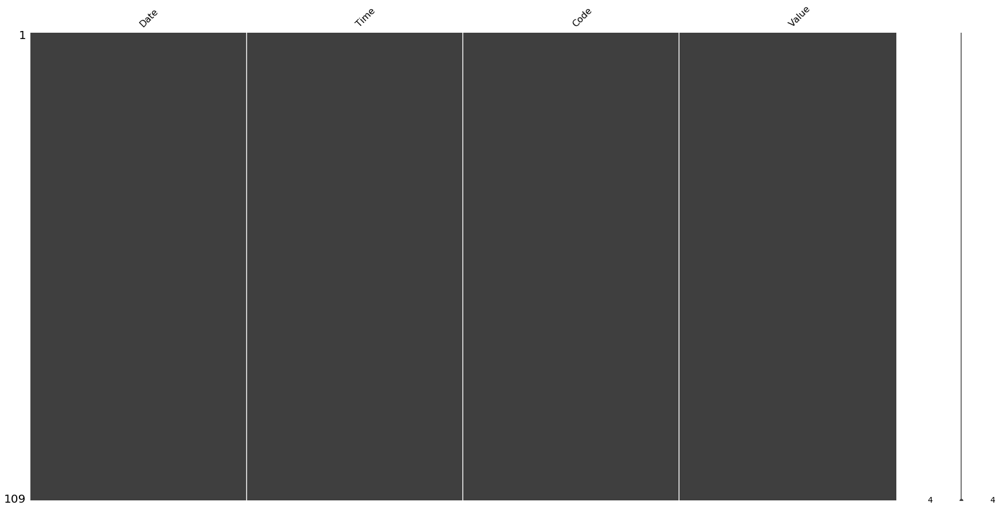

In [18]:
#Visualizing missing values in dataset
for i in range(len(dataframes)):
    missingno.matrix(dataframes[i], figsize = (30,15))

In [19]:
#Dropping missing values from our data set
for i in range(len(dataframes)):
    dataframes[i].dropna(inplace=True)

In [20]:
#Printing statistical information about data set
for i in range(len(dataframes)):
    print(dataframes[i].describe())

             Code       Value
count  368.000000  368.000000
mean    57.309783  159.032609
std      5.053578   69.445912
min     48.000000   35.000000
25%     58.000000  103.000000
50%     58.000000  148.500000
75%     62.000000  207.000000
max     62.000000  343.000000
             Code       Value
count  373.000000  373.000000
mean    57.024129  194.166220
std      5.363352   75.332769
min     48.000000   36.000000
25%     58.000000  141.000000
50%     58.000000  192.000000
75%     60.000000  249.000000
max     62.000000  393.000000
             Code       Value
count  111.000000  111.000000
mean    60.378378  121.207207
std      2.195260   59.117467
min     57.000000   22.000000
25%     58.000000   76.000000
50%     60.000000  110.000000
75%     62.000000  157.000000
max     64.000000  301.000000
             Code       Value
count  126.000000  126.000000
mean    60.833333  155.769841
std      2.345208   73.802890
min     57.000000   38.000000
25%     58.000000   92.500000
50%     60

             Code       Value
count  107.000000  107.000000
mean    60.495327  129.233645
std      2.392495   74.868763
min     57.000000   29.000000
25%     58.000000   67.000000
50%     60.000000  113.000000
75%     62.000000  180.500000
max     64.000000  376.000000
             Code       Value
count  104.000000  104.000000
mean    60.384615  197.057692
std      2.521010  108.096310
min     57.000000   25.000000
25%     58.000000   95.750000
50%     60.000000  191.500000
75%     62.000000  288.250000
max     64.000000  444.000000
             Code       Value
count  110.000000  110.000000
mean    60.590909  195.045455
std      2.491437  108.985513
min     57.000000   20.000000
25%     58.000000   95.250000
50%     60.000000  190.500000
75%     62.000000  288.500000
max     64.000000  434.000000
             Code      Value
count  117.000000  117.00000
mean    60.205128  194.08547
std      2.524154  108.28312
min     57.000000   22.00000
25%     58.000000   87.00000
50%     60.00000

In [21]:
#Adding new column with code names
code_string = {48:'Unspecified BG',
57:'UnspFecified BG',
58:'Pre-breakfast BG',
59:'Post-breakfast BG',
60:'Pre-lunch BG',
61:'Post-lunch BG',
62:'Pre-supper BG',
63:'Post-supper BG',
64:'Pre-snack BG'}
for i in range(len(dataframes)):
    dataframes[i]['CodeName'] = dataframes[i]['Code'].map(code_string)

In [22]:
# Grouping values by CodeName column values
for i in range(len(dataframes)):
    group = dataframes[i][['CodeName','Value']].groupby('CodeName').mean()
    print(group)

                       Value
CodeName                    
Pre-breakfast BG  169.718519
Pre-lunch BG      141.074074
Pre-supper BG     161.235294
Unspecified BG    149.974026
                       Value
CodeName                    
Pre-breakfast BG  207.843750
Pre-lunch BG      176.076087
Pre-supper BG     190.784946
Unspecified BG    201.402174
                       Value
CodeName                    
Pre-breakfast BG  116.868421
Pre-lunch BG       82.080000
Pre-snack BG      110.500000
Pre-supper BG     165.066667
UnspFecified BG   120.500000
                       Value
CodeName                    
Pre-breakfast BG  141.571429
Pre-lunch BG      105.269231
Pre-snack BG      153.233333
Pre-supper BG     217.843750
UnspFecified BG   122.333333
                       Value
CodeName                    
Pre-breakfast BG  147.432432
Pre-lunch BG      114.280000
Pre-snack BG      151.457143
Pre-supper BG     226.878788
UnspFecified BG   178.250000
                       Value
CodeName      

                       Value
CodeName                    
Pre-breakfast BG  245.931034
Pre-lunch BG      155.461538
Pre-snack BG      252.214286
Pre-supper BG     135.611111
UnspFecified BG   280.052632
                       Value
CodeName                    
Pre-breakfast BG  249.166667
Pre-lunch BG      166.360000
Pre-snack BG      238.266667
Pre-supper BG     122.000000
UnspFecified BG   223.190476
                       Value
CodeName                    
Pre-breakfast BG  173.851852
Pre-lunch BG      105.538462
Pre-snack BG      122.772727
Pre-supper BG     108.304348
UnspFecified BG   133.111111
                       Value
CodeName                    
Pre-breakfast BG  210.741935
Pre-lunch BG      201.333333
Pre-snack BG      195.916667
Pre-supper BG     196.500000
UnspFecified BG   149.400000
                       Value
CodeName                    
Pre-breakfast BG  281.969697
Pre-lunch BG      186.619048
Pre-snack BG      156.592593
Pre-supper BG     147.272727
UnspFecified B

/Users/dave/anaconda3/lib/python3.7/site-packages/pandas/plotting/_core.py:304: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


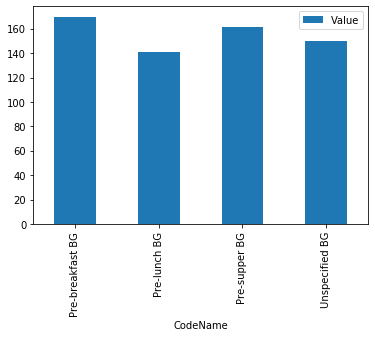

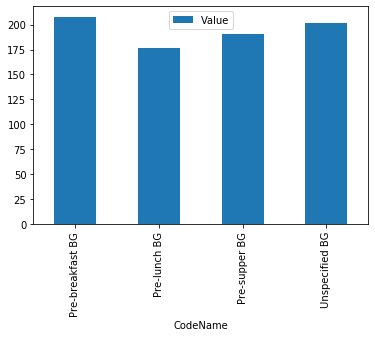

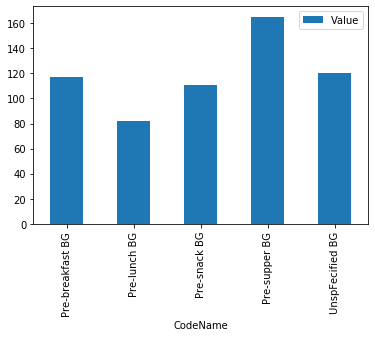

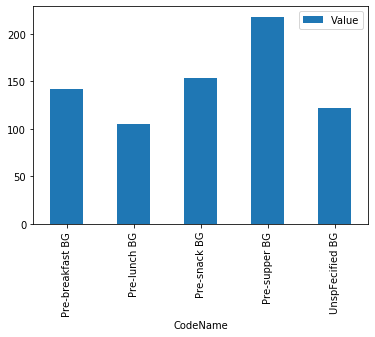

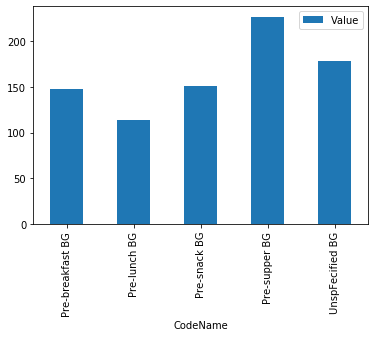

...

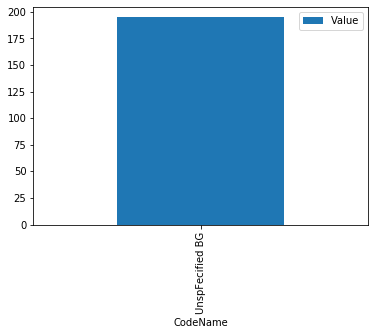

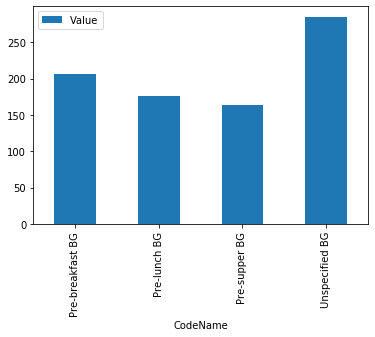

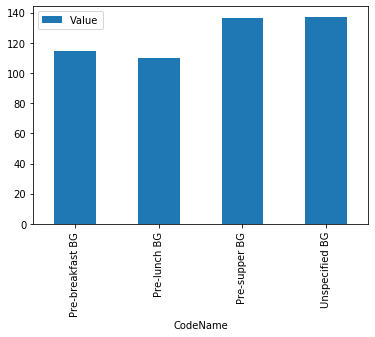

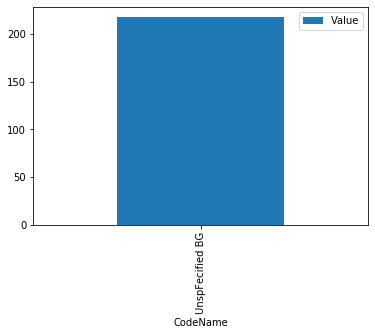

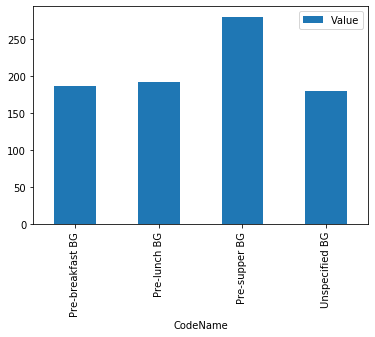

In [23]:
# Grouping values by CodeName column values and plotting them
for i in range(len(dataframes)):
    group = dataframes[i][['CodeName','Value']].groupby('CodeName').mean()
    group.plot(kind='bar')

In [24]:
for i in range(len(dataframes)):
    print(dataframes[i][dataframes[i]['Value'] > 300])

           Date   Time  Code  Value          CodeName
22   04-24-1991  22:09    48    340    Unspecified BG
83   05-03-1991   7:48    58    305  Pre-breakfast BG
134  05-10-1991  17:30    62    343     Pre-supper BG
234  05-26-1991   9:17    58    312  Pre-breakfast BG
277  06-01-1991   9:20    58    313  Pre-breakfast BG
503  06-30-1991  12:06    60    306      Pre-lunch BG
507  06-30-1991  22:38    48    303    Unspecified BG
788  08-09-1991   7:38    58    335  Pre-breakfast BG
833  08-16-1991  22:20    48    309    Unspecified BG
           Date   Time  Code  Value          CodeName
4    10-10-1989  18:00    62  304.0     Pre-supper BG
46   10-16-1989  08:00    58  344.0  Pre-breakfast BG
62   10-18-1989  08:00    58  313.0  Pre-breakfast BG
66   10-18-1989  18:00    62  325.0     Pre-supper BG
88   10-21-1989  12:00    60  306.0      Pre-lunch BG
157  10-29-1989  22:00    48  388.0    Unspecified BG
163  10-30-1989  18:00    62  365.0     Pre-supper BG
185  11-02-1989  12:00    60

/Users/dave/anaconda3/lib/python3.7/site-packages/pandas/plotting/_tools.py:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


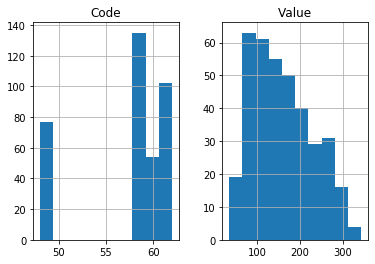

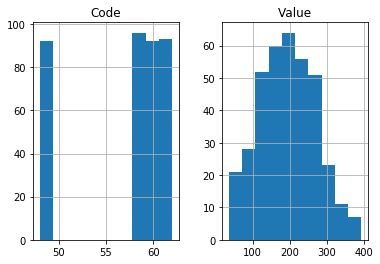

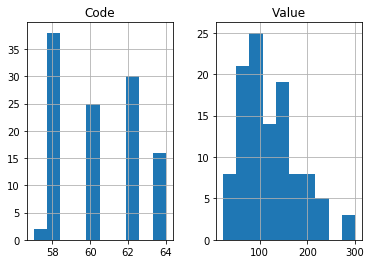

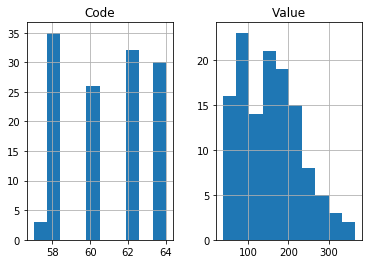

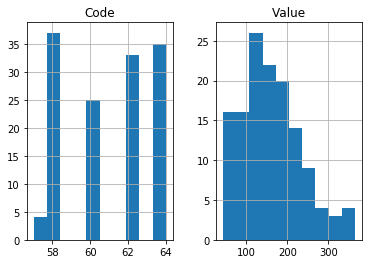

...

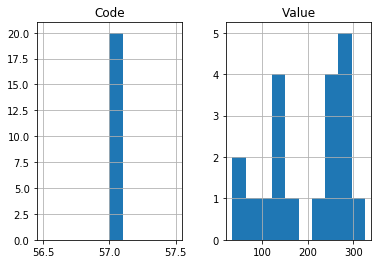

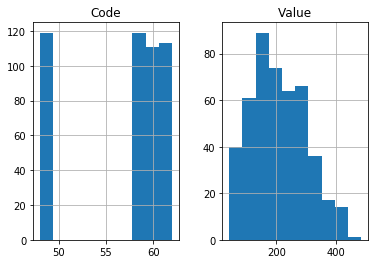

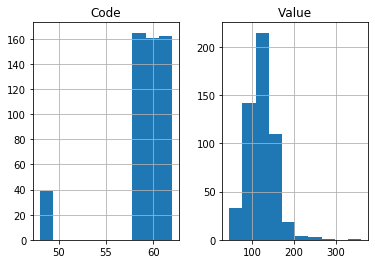

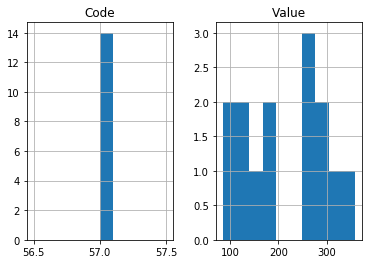

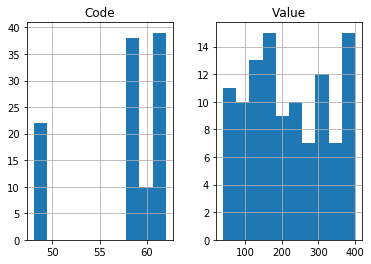

In [25]:
#Plotting the histogram of numerical columns
for i in range(len(dataframes)):
    dataframes[i].hist()

/Users/dave/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/dave/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/Users/dave/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:1270: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until expli

<Figure size 432x288 with 0 Axes>

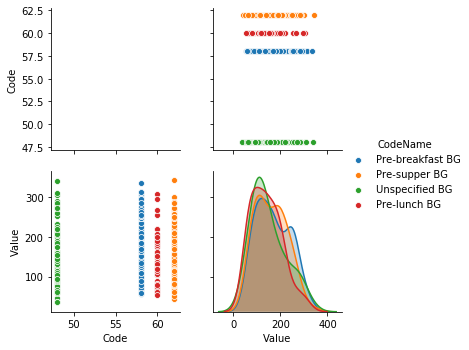

<Figure size 432x288 with 0 Axes>

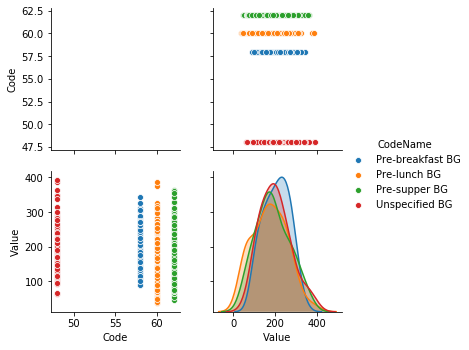

<Figure size 432x288 with 0 Axes>

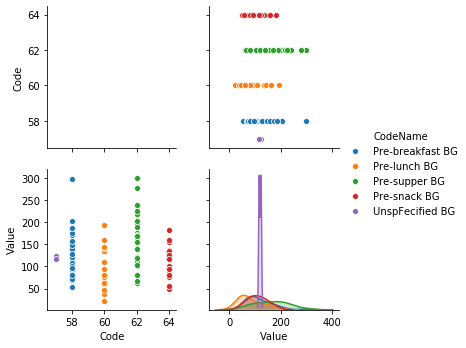

<Figure size 432x288 with 0 Axes>

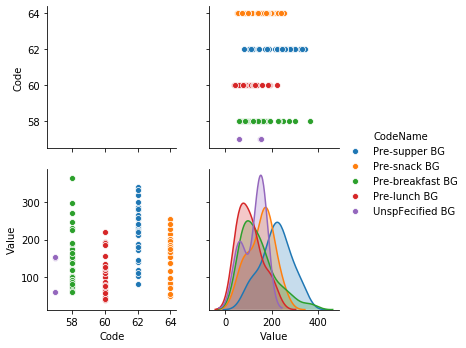

<Figure size 432x288 with 0 Axes>

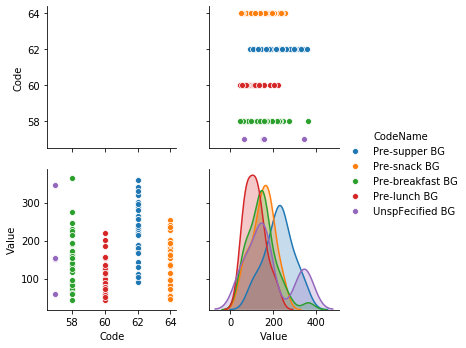

<Figure size 432x288 with 0 Axes>

Error in callback <function flush_figures at 0x11a315e18> (for post_execute):


KeyboardInterrupt: 

In [26]:
#Plotting pairplot by using seaborn,distribution of CodeName
for i in range(len(dataframes)):
    df = dataframes[i]
    plt.figure()
    sns.pairplot(df,hue='CodeName')

/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


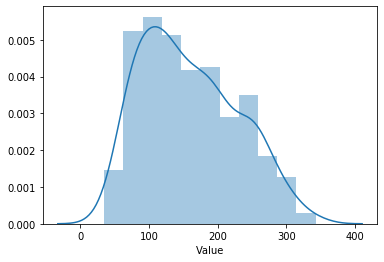

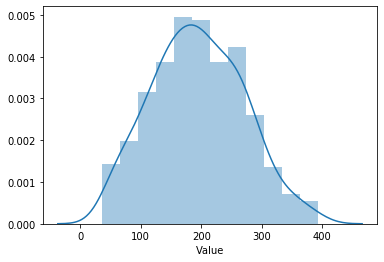

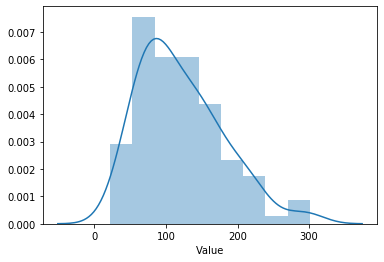

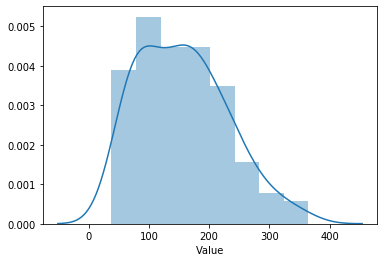

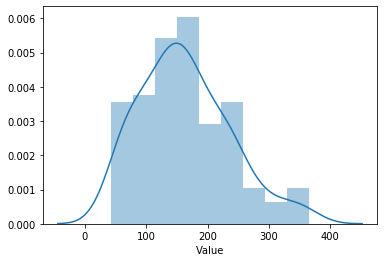

...

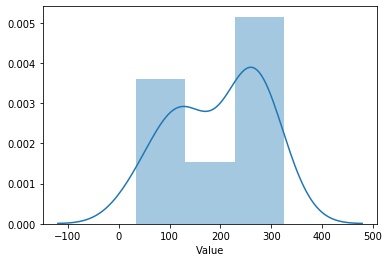

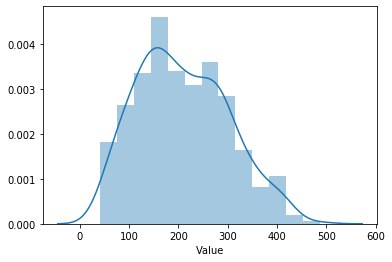

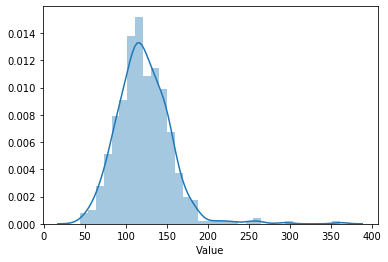

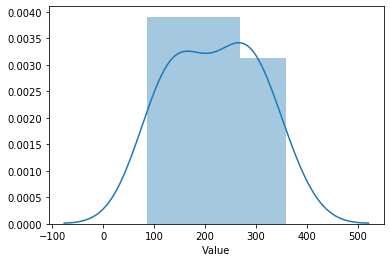

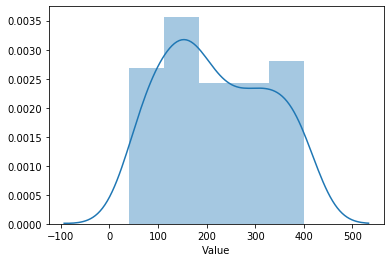

In [27]:
#Plotting histogram of Value column
for i in range(len(dataframes)):
    df = dataframes[i]['Value']
    plt.figure()
    sns.distplot(df)

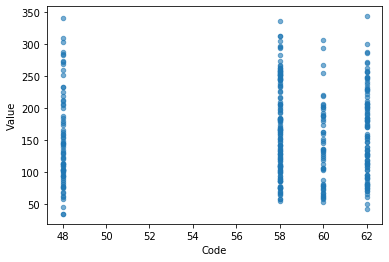

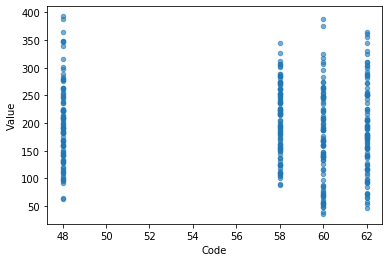

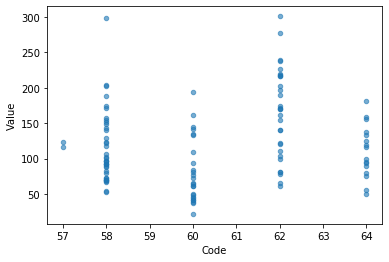

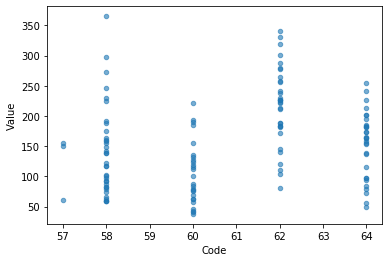

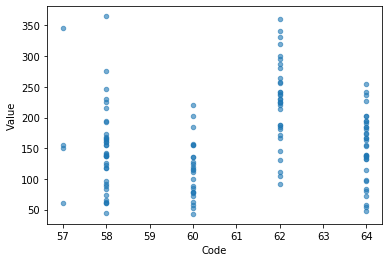

...

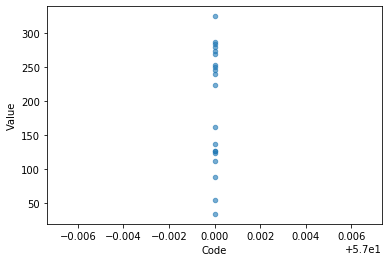

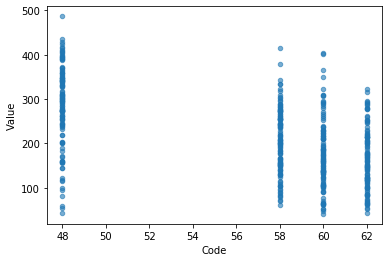

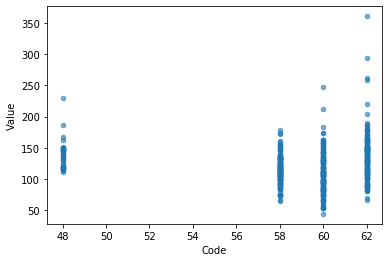

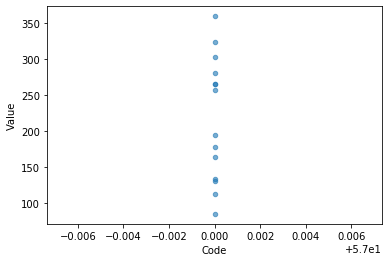

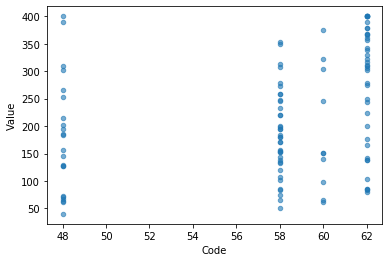

In [28]:
#Plotting scatter plot
for i in range(len(dataframes)):
    dataframes[i].plot(kind='scatter', x='Code', y='Value', alpha=0.6)

/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitl

/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitl

/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


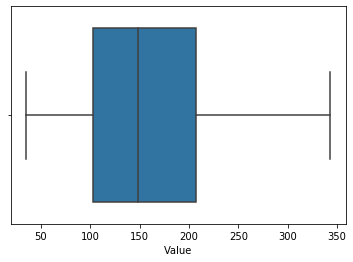

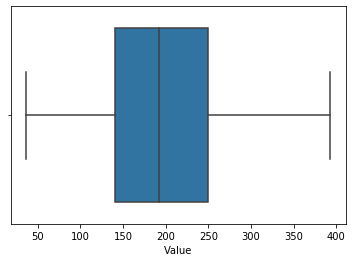

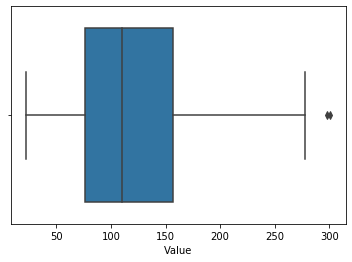

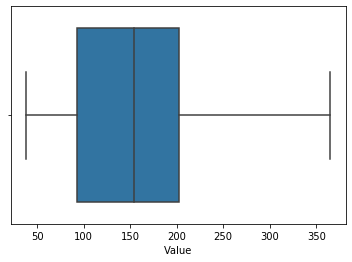

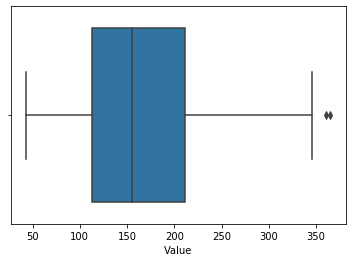

...

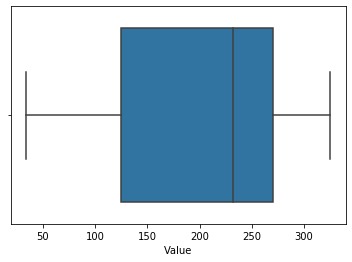

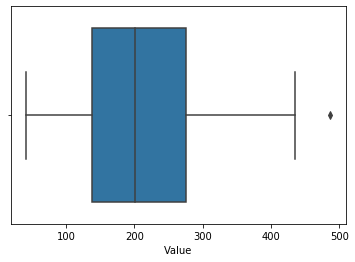

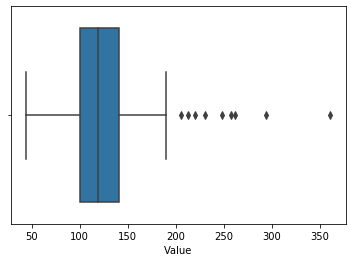

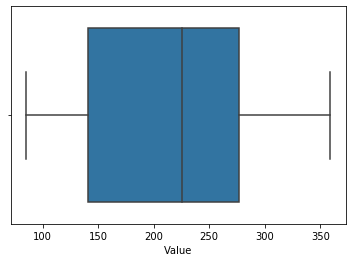

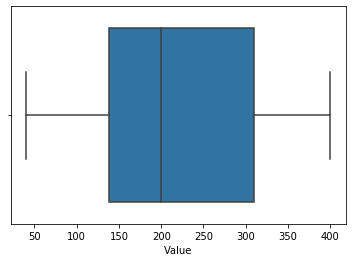

In [29]:
#Plotting boxplots to see outliers
for i in range(len(dataframes)):
    df = dataframes[i]['Value']
    plt.figure()
    sns.boxplot(df)

/Users/dave/anaconda3/lib/python3.7/site-packages/pandas/plotting/_core.py:304: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


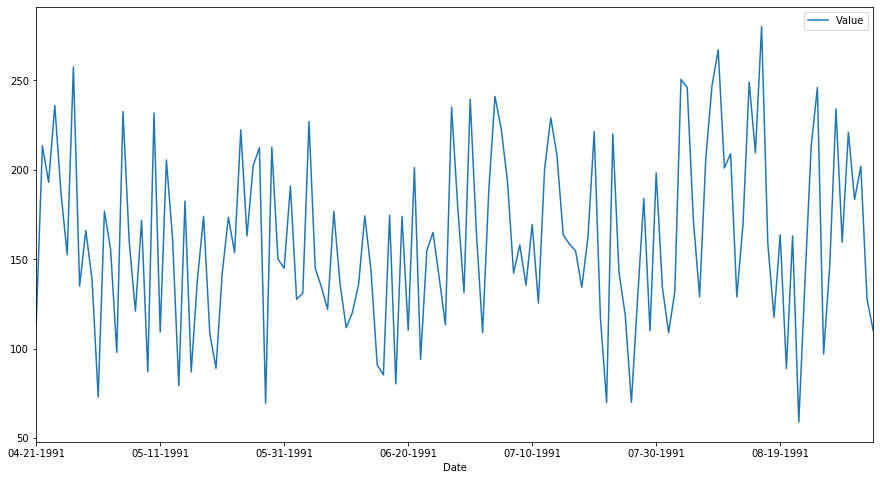

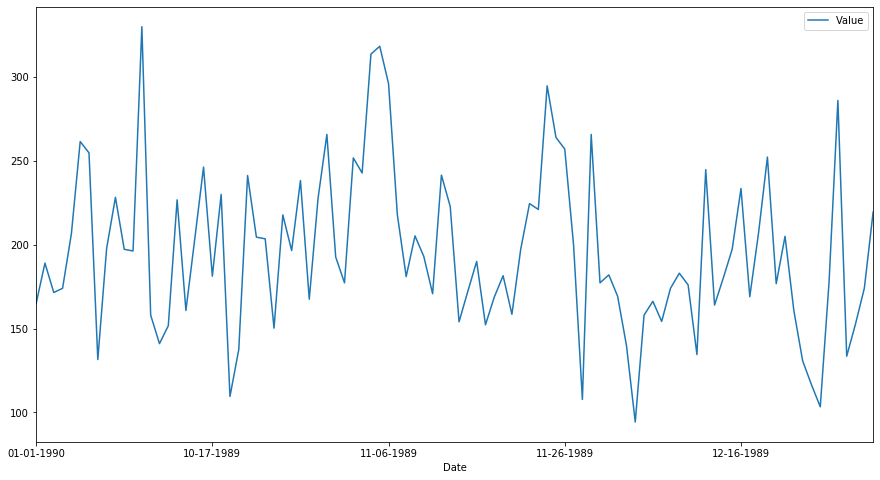

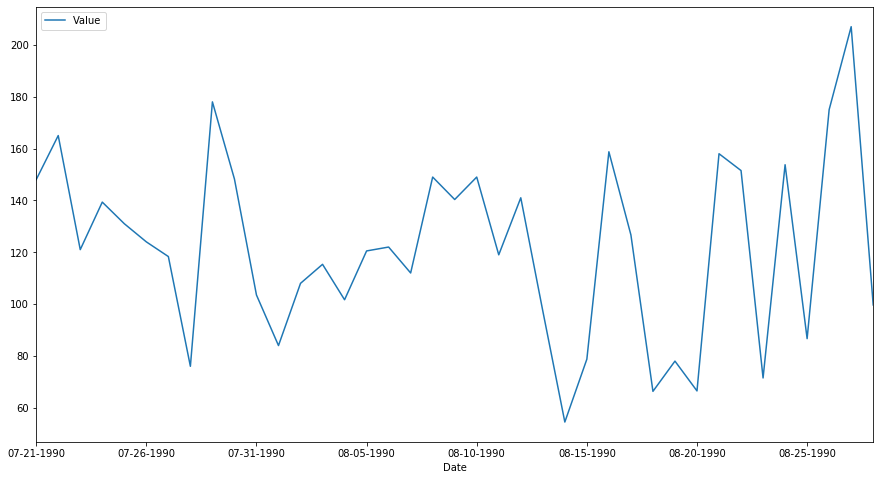

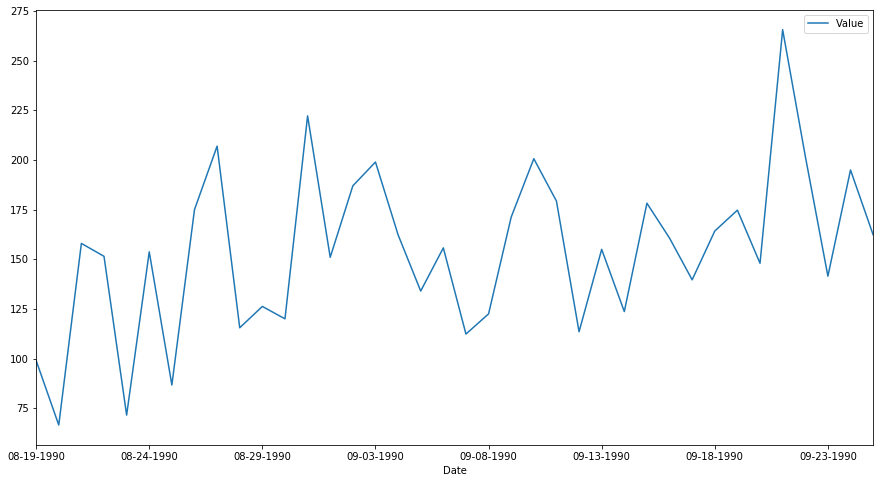

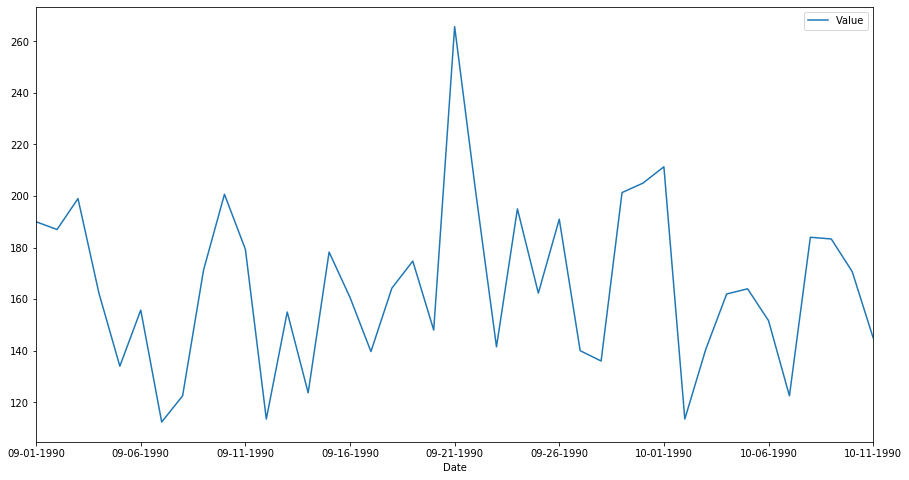

...

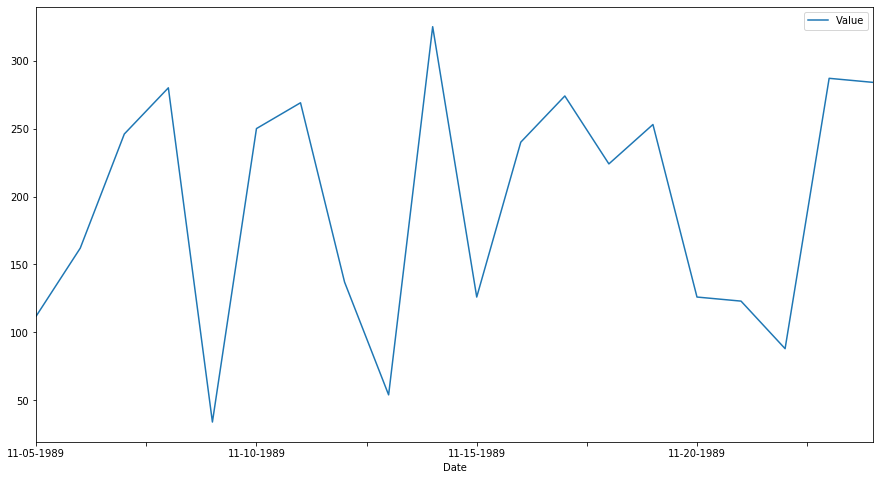

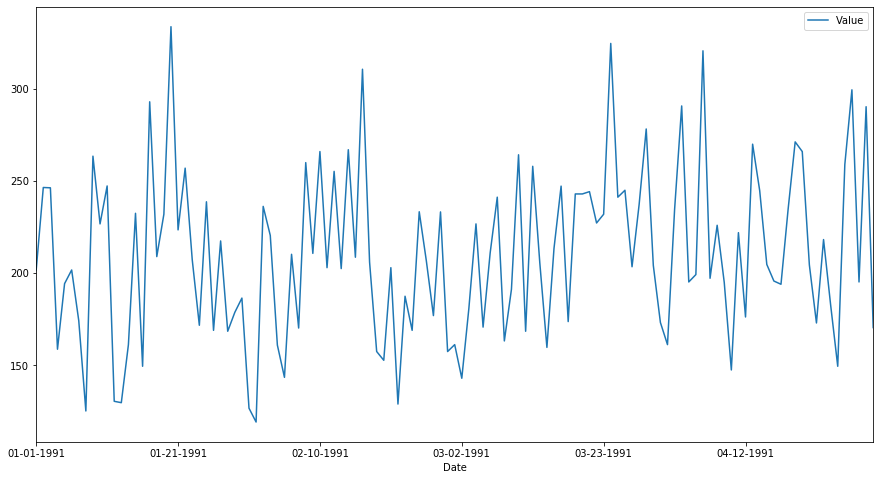

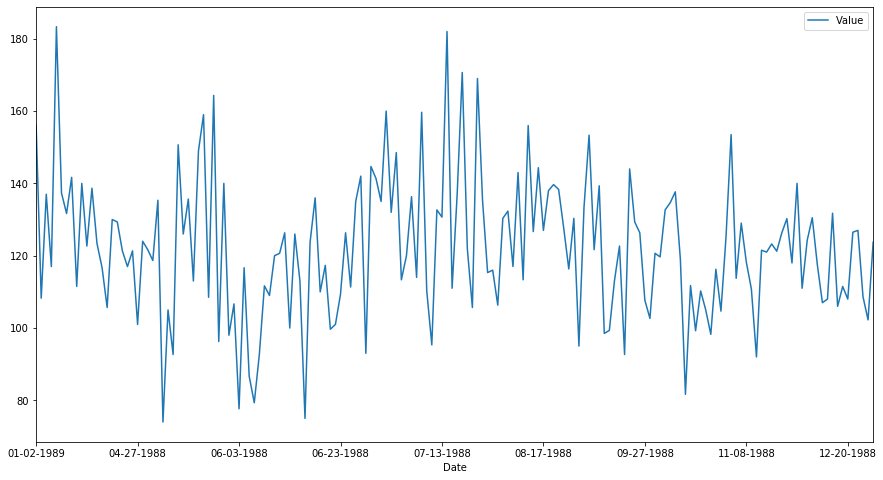

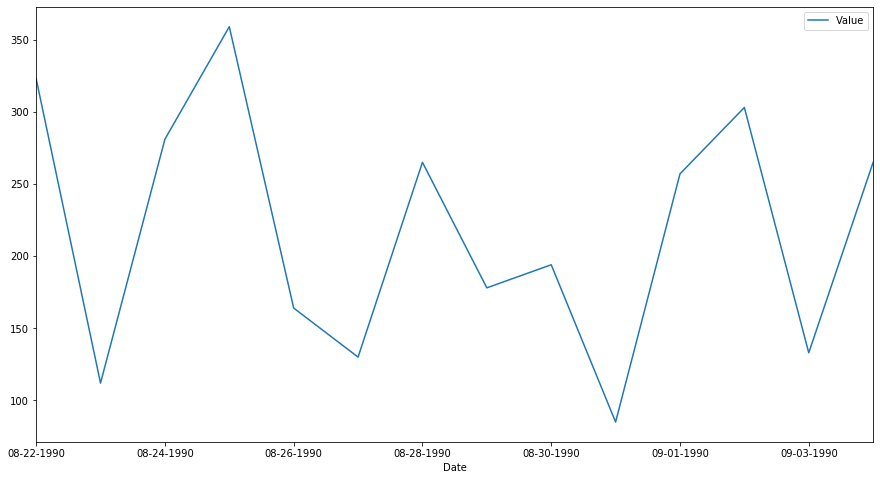

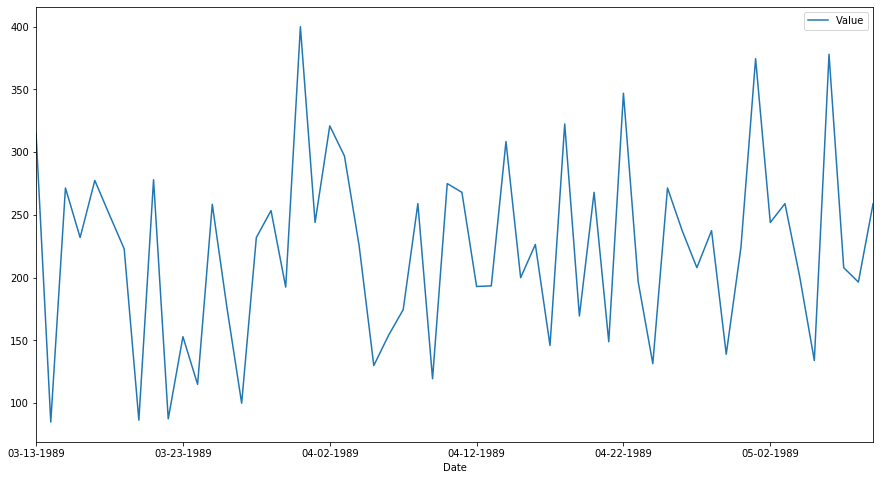

In [30]:
# Plotting Values by date
for i in range(len(dataframes)):
    group = dataframes[i][['Value','Date']].groupby('Date').mean()
    group.plot(figsize=(15, 8))

/Users/dave/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


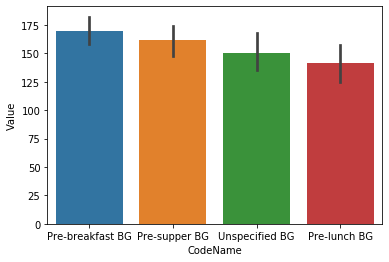

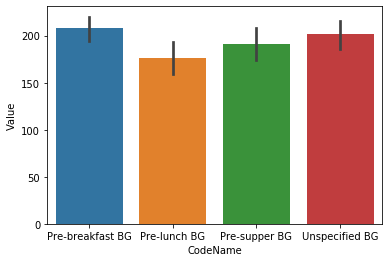

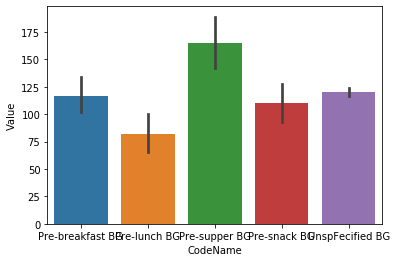

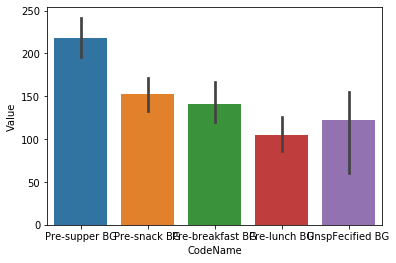

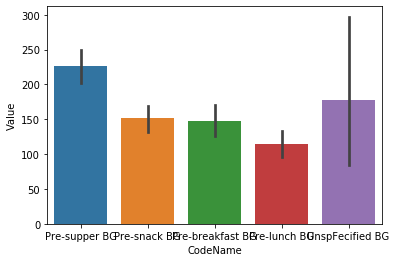

...

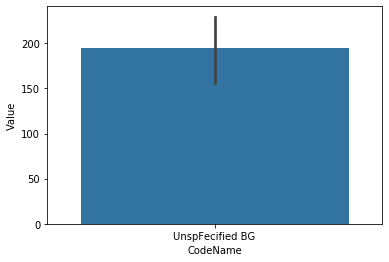

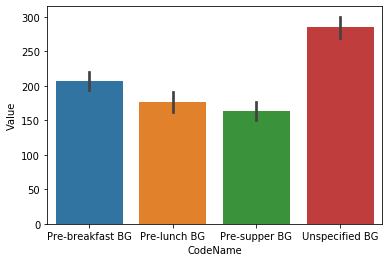

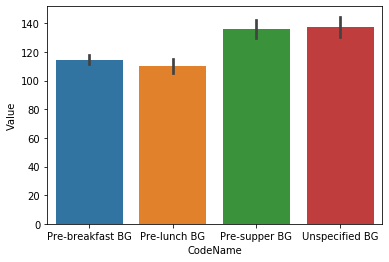

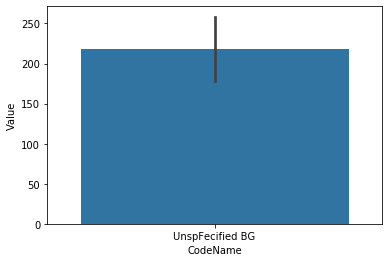

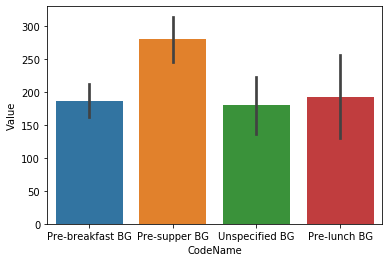

In [31]:
# barplot of CodeNames and Values on seaborn
for i in range(len(dataframes)):
    df = dataframes[i]
    x=df['CodeName']
    y=df['Value']
    plt.figure()
    sns.barplot(x,y)

In [32]:
#Adding types column
for i in range(len(dataframes)):
    if dataframes[i][dataframes[i]['Value'] > 260]['Value'].count() > 20:
        dataframes[i]['Type'] = 3
    elif dataframes[i][dataframes[i]['Value'] < 80]['Value'].count() > 20:
        dataframes[i]['Type'] = 2 
    else:
        dataframes[i]['Type'] = 1

        

In [33]:
#Adding Id column
for i in range(len(dataframes)):
    dataframes[i]['Id'] = i+1

In [34]:
#Printing first dataframe to check
dataframes[0].head()

,Date,Time,Code,Value,CodeName,Type,Id
0,04-21-1991,9:09,58,100,Pre-breakfast BG,3,1
3,04-21-1991,17:08,62,119,Pre-supper BG,3,1
5,04-21-1991,22:51,48,123,Unspecified BG,3,1
6,04-22-1991,7:35,58,216,Pre-breakfast BG,3,1
10,04-22-1991,16:56,62,211,Pre-supper BG,3,1


In [35]:
#Concatinating all dataframes to one
allData = pd.DataFrame(np.concatenate(dataframes))

In [36]:
#Defining columns name
allData.columns = ['Date','Time','Code','Value','CodeName','Type','Id']

In [37]:
#Counting each type values
allData['Type'].value_counts()

3    5456
2    5306
1    1895
Name: Type, dtype: int64

In [39]:
allData[].groupby('Type').sum()

,Date,Time,Code,Value,CodeName,Id
Type,,,,,,
1,09-01-199009-01-199009-02-199009-02-199009-02-...,16:4822:2508:0111:4017:1721:5708:0412:3817:062...,111501,305580.0,Pre-supper BGPre-snack BGPre-breakfast BGPre-l...,53086
2,07-21-199007-21-199007-21-199007-21-199007-22-...,06:4310:5716:1420:1205:5816:0505:0611:3716:430...,312084,730945.0,Pre-breakfast BGPre-lunch BGPre-supper BGPre-s...,194493
3,04-21-199104-21-199104-21-199104-22-199104-22-...,9:0917:0822:517:3516:567:2517:257:5217:1022:09...,314683,979520.0,Pre-breakfast BGPre-supper BGUnspecified BGPre...,223605


In [132]:
#Saving new dataframe
allData.to_csv('new_diabetes_data.csv')